In [0]:
pip install Pillow

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
from pyspark.sql.functions import udf, col, expr, first, max, min
from pyspark.sql import functions as F, DataFrame, Window
from pyspark.sql.types import StructType, StructField, StringType, DoubleType, FloatType, ArrayType, TimestampType
from datetime import datetime, time, timedelta
import requests 
import time
import builtins
import json
import math
from IPython.display import Image
import itertools
from functools import reduce
import numpy as np
from io import BytesIO
from PIL import Image as PILImage, ImageDraw, ImageFont



In [0]:
dbutils.widgets.dropdown("Competition_Year", "2024", ["2025", "2024", "2019", "2018", "2017"])
Competition_Year = dbutils.widgets.get("Competition_Year")

dbutils.widgets.dropdown("MapStyle", "Outdoor_27700", ["Outdoor_27700", "Leisure_27700", "Road_27700", "Light_27700"])
MapStyle = dbutils.widgets.get("MapStyle")

dbutils.widgets.dropdown("Zoom Level", "7", ["0","1","2","3","4","5","6","7","8","9"])
zoom_level = int(dbutils.widgets.get("Zoom Level"))

#dbutils.widgets.dropdown("API_Service", "Google Maps", ["Bing Maps","Google Maps", "OpenRouteService"])
#Mapping_Service = dbutils.widgets.get("API_Service") 


In [0]:
OpenRouteServiceAPIKey = dbutils.secrets.get(scope = "allpay-dwh01-scope", key = "OpenRouteServiceAPIKey")
BingMapsAPIKey = dbutils.secrets.get(scope = "allpay-dwh01-scope", key = "BingMapsAPI-Key")
GoogleMapsAPIKey = dbutils.secrets.get(scope = "allpay-dwh01-scope", key = "GoogleMapsAPIKey")
OrdnanceSurveyMapsAPIKey = dbutils.secrets.get(scope = "allpay-dwh01-scope", key = "OrdnanceSurveyMapsAPIKey")

In [0]:
databricksServicePrincipalClientId = dbutils.secrets.get(scope = "allpay-dwh01-scope", key = "Databricks-Client-Id")
databricksServicePrincipalClientSecret = dbutils.secrets.get(scope = "allpay-dwh01-scope", key = "Databricks-Client-Secret")
azureADTenant = dbutils.secrets.get(scope = "allpay-dwh01-scope", key = "AzureAD-Tenant-GUID")
endpoint = "https://login.microsoftonline.com/" + azureADTenant + "/oauth2/token"
Folder = "abfss://qaha7ai04@allpaydwh01datalake.dfs.core.windows.net"
spark.conf.set("fs.azure.account.auth.type", "OAuth")
spark.conf.set("fs.azure.account.oauth.provider.type", "org.apache.hadoop.fs.azurebfs.oauth2.ClientCredsTokenProvider")
spark.conf.set("fs.azure.account.oauth2.client.id", databricksServicePrincipalClientId)
spark.conf.set("fs.azure.account.oauth2.client.secret", databricksServicePrincipalClientSecret)
spark.conf.set("fs.azure.account.oauth2.client.endpoint", endpoint)

In [0]:
opening_file_path = Folder + "/Dovetrek/Openings_" + Competition_Year + ".csv"

# Read csv files into PySpark DataFrames
openings_df = spark.read.csv(opening_file_path, header=True, inferSchema=True)


In [0]:
openings_df = openings_df.withColumn("NGR_Easting", F.concat(F.lit("4"), F.substring(openings_df.BNG, 1, 3), F.lit("00")).cast("double")) \
                    .withColumn("NGR_Northing", F.concat(F.lit("3"), F.substring(openings_df.BNG, 5, 3), F.lit("00")).cast("double"))
display(openings_df)

CP,BNG,1000,1030,1100,1130,1200,1230,1300,1330,1400,1430,1500,1530,1600,1630,1700,NGR_Easting,NGR_Northing
Start,258 779,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,425800.0,377900.0
CP1,251 801,0,0,1,1,1,0,0,0,0,0,1,1,1,1,1,425100.0,380100.0
CP2,265 801,1,1,1,1,1,1,0,0,0,1,1,0,0,0,0,426500.0,380100.0
CP3,268 789,1,1,0,0,0,0,0,0,0,0,0,0,1,1,1,426800.0,378900.0
CP4,262 747,0,0,0,1,1,0,0,0,1,1,1,1,1,0,0,426200.0,374700.0
CP5,254 775,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,425400.0,377500.0
CP6,251 786,0,1,1,0,0,1,1,1,1,1,0,0,1,0,0,425100.0,378600.0
CP7,247 801,0,0,1,1,1,1,1,1,0,0,0,0,0,1,1,424700.0,380100.0
E1,251 807,0,1,1,1,0,0,1,1,1,0,0,1,1,1,0,425100.0,380700.0
E2R,274 814,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,427400.0,381400.0


In [0]:
LatLong_Df = spark.createDataFrame(
    [(1, 1.0, 1.0)], 
    schema='CP string, Latitude float, Longitude float'
)
LatLong_Df = LatLong_Df.filter('1!=1')

# Convert DataFrame to a list
gridrefs_list = openings_df.select(
    openings_df.CP, 
    openings_df.NGR_Easting, 
    openings_df.NGR_Northing
).collect()

# Iterate over the list
for row in gridrefs_list:
    # Perform desired operations with the column values
    resp = requests.get(
        "http://webapps.bgs.ac.uk/data/webservices/CoordConvert_LL_BNG.cfc?method=BNGtoLatLng&easting=" 
        + str(row.NGR_Easting) 
        + "&northing=" 
        + str(row.NGR_Northing)
    )
    
    # Parse the JSON response
    json_resp = json.loads(resp.text)

    # Check if 'LATITUDE' and 'LONGITUDE' keys exist in the response
    if 'LATITUDE' in json_resp and 'LONGITUDE' in json_resp:
        # Extract latitude and longitude values
        latitude = json_resp['LATITUDE']
        longitude = json_resp['LONGITUDE']
        cp = row["CP"]
        
        df = spark.createDataFrame(
            [(cp, latitude, longitude)], 
            'CP string, Latitude float, Longitude float'
        )
        LatLong_Df = LatLong_Df.union(df)

openings_df = openings_df.join(LatLong_Df, openings_df.CP == LatLong_Df.CP).drop(LatLong_Df.CP)

LatLong_Df.unpersist()
# Show DataFrame
display(openings_df)

CP,BNG,1000,1030,1100,1130,1200,1230,1300,1330,1400,1430,1500,1530,1600,1630,1700,NGR_Easting,NGR_Northing,Latitude,Longitude
Start,258 779,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,425800.0,377900.0,53.297432,-1.6143645
CP1,251 801,0,0,1,1,1,0,0,0,0,0,1,1,1,1,1,425100.0,380100.0,53.31724,-1.6246936
CP2,265 801,1,1,1,1,1,1,0,0,0,1,1,0,0,0,0,426500.0,380100.0,53.317173,-1.6036792
CP3,268 789,1,1,0,0,0,0,0,0,0,0,0,0,1,1,1,426800.0,378900.0,53.30637,-1.5992771
CP4,262 747,0,0,0,1,1,0,0,0,1,1,1,1,1,0,0,426200.0,374700.0,53.26865,-1.6086259
CP5,254 775,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,425400.0,377500.0,53.293858,-1.6203977
CP6,251 786,0,1,1,0,0,1,1,1,1,1,0,0,1,0,0,425100.0,378600.0,53.303757,-1.6248118
CP7,247 801,0,0,1,1,1,1,1,1,0,0,0,0,0,1,1,424700.0,380100.0,53.31726,-1.6306977
E1,251 807,0,1,1,1,0,0,1,1,1,0,0,1,1,1,0,425100.0,380700.0,53.32263,-1.6246463
E2R,274 814,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,427400.0,381400.0,53.32881,-1.5900581


In [0]:
east, west, north, south = openings_df.agg(
    max(col("Longitude")).alias("East"),
    min(col("Longitude")).alias("West"),
    max(col("Latitude")).alias("North"),
    min(col("Latitude")).alias("South"),
).first()

north, east, south, west

(53.33161544799805,
 -1.5900580883026123,
 53.26693344116211,
 -1.6501671075820923)

In [0]:
# Aggregate and pad Easting/Northing correctly
east, west, north, south = openings_df.agg(
    max(col("NGR_Easting")).cast("int").alias("East"),
    min(col("NGR_Easting")).cast("int").alias("West"),
    max(col("NGR_Northing")).cast("int").alias("North"),
    min(col("NGR_Northing")).cast("int").alias("South"),
).first()

# Collect bounding box values

north, east, south, west

(381700, 427400, 374500, 423400)

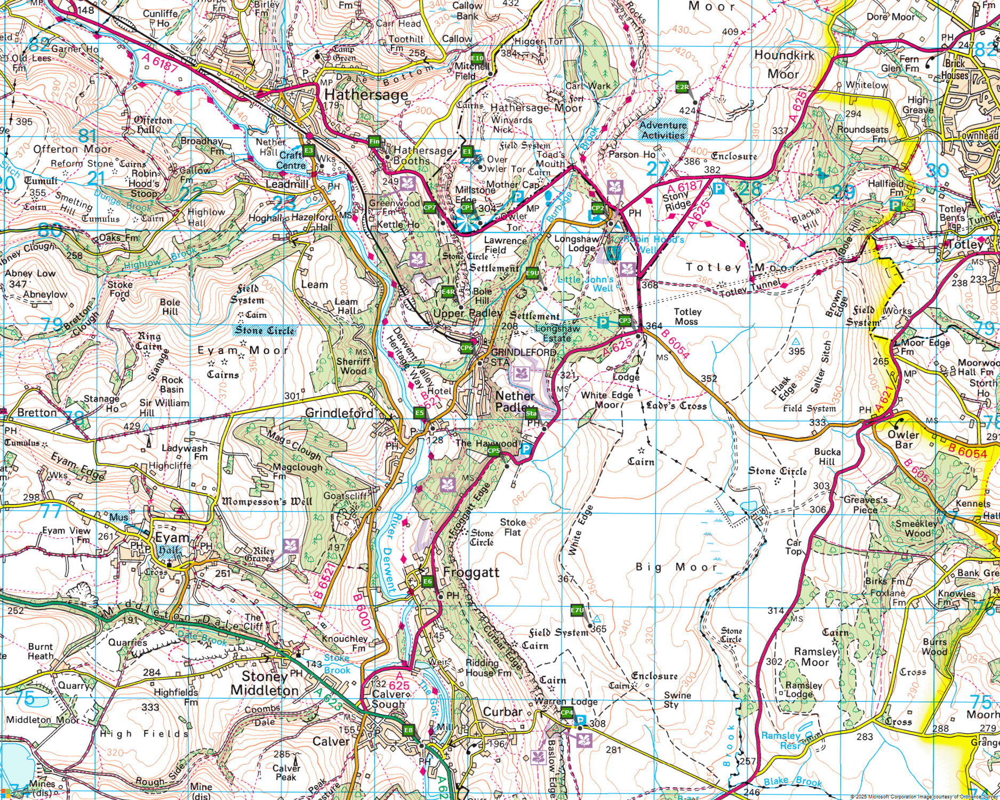

200

In [0]:
url = "https://dev.virtualearth.net/REST/v1/Imagery/Map/Road"

# url = "https://dev.virtualearth.net/REST/v1/Imagery/Map/imagerySet?pushpin=53.369583,-1.6978767;;St&mapLAyer=OrdnanceSurvey&format=png&mapMetadata=0&key=" + BingMapsAPIKey

# https://dev.virtualearth.net/REST/v1/Imagery/Map/imagerySet?pushpin={pushpin_1}&pushpin={pushpin_2}&pushpin={pushpin_n}&mapLayer={mapLayer}&format={format}&mapMetadata={mapMetadata}&key={BingMapsKey}

url_params = {
    "mapLayer": "OrdnanceSurvey",
    "format": "png",
    "mapMetadata": 0,
    "declutterPins": 0,
    "mapSize": "2000, 1600",
 #   "mapArea": f"{north_east},{south_west}",
    "key": BingMapsAPIKey
}

req_body = "&".join([f"pp={row['Latitude']},{row['Longitude']};35;{row['CP'][:3]}" for row in openings_df.collect()])
req_body_bytes = req_body.encode('utf-8')

req_headers = {
    "content-type": "text/plain",
    "charset": "utf-8",
    "Content-Length":str(len(req_body_bytes))
}

resp = requests.post(url, headers=req_headers, params=url_params, data=req_body)

display(Image(resp.content))
resp.status_code


In [0]:
# Constants
# https://github.com/OrdnanceSurvey/tile-name-derivation is the font of knowledge

TILE_SIZE = 256  # Pixels per tile
ORIGIN_X = -238375.0  # False origin X
ORIGIN_Y = 1376256.0  # False origin Y

# Define scale per zoom level (meters per pixel)
ZOOM_RESOLUTIONS = {
    0: 896,
    1: 448,
    2: 224,
    3: 112,
    4: 56,
    5: 28,
    6: 14,
    7: 7,
    8: 3.5,
    9: 1.75,
    10: 0.875,
    11: 0.4375,
    12: 0.21875,
    13: 0.109375
}

def ngr_to_tile(easting, northing, zoom):
    """Convert BNG easting/northing to OS tile x, y at a given zoom level using false origin."""
    resolution = ZOOM_RESOLUTIONS.get(zoom, 896)  # Default to zoom 0 if not found
    # Calculate tile meters
    tile_meters = TILE_SIZE * (896 / (2 ** zoom))  
    # Convert to tile coordinates
    tile_x = math.floor((easting - ORIGIN_X) / tile_meters)
    tile_y = math.floor((ORIGIN_Y - northing) / tile_meters)
    print(f"Zoom: {zoom}, Resolution: {resolution}m per pixel, Tile meters: {tile_meters}m")
    print(f"Easting: {easting}, Northing: {northing} -> Tile X: {tile_x}, Tile Y: {tile_y}")
    return tile_x, tile_y

# Convert bounding box to tile coordinates
x_min, y_min = ngr_to_tile(west, north, zoom_level)  # Top-left tile
x_max, y_max = ngr_to_tile(east, south, zoom_level)  # Bottom-right tile

# Generate all tile coordinates in range
tiles = [(zoom_level, x, y) for x in range(x_min, x_max + 1) for y in range(y_min, y_max + 1)]

# Print the tile coordinates
print(f"Total Tiles: {len(tiles)}")
for tile in tiles:
    print(tile)  # (zoom, x, y)

Zoom: 9, Resolution: 1.75m per pixel, Tile meters: 448.0m
Easting: 423400, Northing: 381700 -> Tile X: 1477, Tile Y: 2219
Zoom: 9, Resolution: 1.75m per pixel, Tile meters: 448.0m
Easting: 427400, Northing: 374500 -> Tile X: 1486, Tile Y: 2236
Total Tiles: 180
(9, 1477, 2219)
(9, 1477, 2220)
(9, 1477, 2221)
(9, 1477, 2222)
(9, 1477, 2223)
(9, 1477, 2224)
(9, 1477, 2225)
(9, 1477, 2226)
(9, 1477, 2227)
(9, 1477, 2228)
(9, 1477, 2229)
(9, 1477, 2230)
(9, 1477, 2231)
(9, 1477, 2232)
(9, 1477, 2233)
(9, 1477, 2234)
(9, 1477, 2235)
(9, 1477, 2236)
(9, 1478, 2219)
(9, 1478, 2220)
(9, 1478, 2221)
(9, 1478, 2222)
(9, 1478, 2223)
(9, 1478, 2224)
(9, 1478, 2225)
(9, 1478, 2226)
(9, 1478, 2227)
(9, 1478, 2228)
(9, 1478, 2229)
(9, 1478, 2230)
(9, 1478, 2231)
(9, 1478, 2232)
(9, 1478, 2233)
(9, 1478, 2234)
(9, 1478, 2235)
(9, 1478, 2236)
(9, 1479, 2219)
(9, 1479, 2220)
(9, 1479, 2221)
(9, 1479, 2222)
(9, 1479, 2223)
(9, 1479, 2224)
(9, 1479, 2225)
(9, 1479, 2226)
(9, 1479, 2227)
(9, 1479, 2228)
(9,

In [0]:
def get_pixel_coords(easting, northing, zoom=zoom_level):
    tileMeters = TILE_SIZE * (896 / (2 ** zoom))  # Tile size in meters

    # Compute tile column and row
    tile_x = math.floor((easting - ORIGIN_X) / tileMeters)
    tile_y = math.floor((ORIGIN_Y - northing) / tileMeters)

    # Compute tile top-left corner
    tile_top_left_easting = ORIGIN_X + (tile_x * tileMeters)
    tile_top_left_northing = ORIGIN_Y - (tile_y * tileMeters)

    # Compute pixel coordinates within the tile
    pixel_x = (easting - tile_top_left_easting) / (tileMeters / 256)
    pixel_y = (tile_top_left_northing - northing) / (tileMeters / 256)

    return f"{pixel_x:.2f}, {pixel_y:.2f}"  


In [0]:
# Define UDF to format the tilename
def get_tilename(easting, northing, zoom=zoom_level):
    tile_x, tile_y = ngr_to_tile(easting, northing, zoom)
    return f"{zoom}/{tile_x}/{tile_y}"

# Register UDF
tile_name_udf = udf(get_tilename, StringType())
pixel_coords_udf = udf(get_pixel_coords, StringType())

openings_df = openings_df.withColumn("tilename", tile_name_udf(openings_df["NGR_Easting"], openings_df["NGR_Northing"]))
openings_df = openings_df.withColumn("pixel_coords", pixel_coords_udf(openings_df["NGR_Easting"], openings_df["NGR_Northing"]))

# Show result
display(openings_df)

CP,BNG,1000,1030,1100,1130,1200,1230,1300,1330,1400,1430,1500,1530,1600,1630,1700,NGR_Easting,NGR_Northing,Latitude,Longitude,tilename,pixel_coords
Start,258 779,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,425800.0,377900.0,53.297432,-1.6143645,9/1482/2228,"136.57, 121.14"
CP1,251 801,0,0,1,1,1,0,0,0,0,0,1,1,1,1,1,425100.0,380100.0,53.31724,-1.6246936,9/1480/2223,"248.57, 144.00"
CP2,265 801,1,1,1,1,1,1,0,0,0,1,1,0,0,0,0,426500.0,380100.0,53.317173,-1.6036792,9/1484/2223,"24.57, 144.00"
CP3,268 789,1,1,0,0,0,0,0,0,0,0,0,0,1,1,1,426800.0,378900.0,53.30637,-1.5992771,9/1484/2226,"196.00, 61.71"
CP4,262 747,0,0,0,1,1,0,0,0,1,1,1,1,1,0,0,426200.0,374700.0,53.26865,-1.6086259,9/1483/2235,"109.14, 157.71"
CP5,254 775,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,425400.0,377500.0,53.293858,-1.6203977,9/1481/2229,"164.00, 93.71"
CP6,251 786,0,1,1,0,0,1,1,1,1,1,0,0,1,0,0,425100.0,378600.0,53.303757,-1.6248118,9/1480/2226,"248.57, 233.14"
CP7,247 801,0,0,1,1,1,1,1,1,0,0,0,0,0,1,1,424700.0,380100.0,53.31726,-1.6306977,9/1480/2223,"20.00, 144.00"
E1,251 807,0,1,1,1,0,0,1,1,1,0,0,1,1,1,0,425100.0,380700.0,53.32263,-1.6246463,9/1480/2222,"248.57, 57.14"
E2R,274 814,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,427400.0,381400.0,53.32881,-1.5900581,9/1486/2220,"26.86, 169.14"


Downloaded and processed tile: https://api.os.uk/maps/raster/v1/zxy/Outdoor_27700/9/1477/2219.png?key=[REDACTED]
Downloaded and processed tile: https://api.os.uk/maps/raster/v1/zxy/Outdoor_27700/9/1477/2220.png?key=[REDACTED]
Downloaded and processed tile: https://api.os.uk/maps/raster/v1/zxy/Outdoor_27700/9/1477/2221.png?key=[REDACTED]
Downloaded and processed tile: https://api.os.uk/maps/raster/v1/zxy/Outdoor_27700/9/1477/2222.png?key=[REDACTED]
Downloaded and processed tile: https://api.os.uk/maps/raster/v1/zxy/Outdoor_27700/9/1477/2223.png?key=[REDACTED]
Downloaded and processed tile: https://api.os.uk/maps/raster/v1/zxy/Outdoor_27700/9/1477/2224.png?key=[REDACTED]
Downloaded and processed tile: https://api.os.uk/maps/raster/v1/zxy/Outdoor_27700/9/1477/2225.png?key=[REDACTED]
Downloaded and processed tile: https://api.os.uk/maps/raster/v1/zxy/Outdoor_27700/9/1477/2226.png?key=[REDACTED]
Downloaded and processed tile: https://api.os.uk/maps/raster/v1/zxy/Outdoor_27700/9/1477/2227.pn

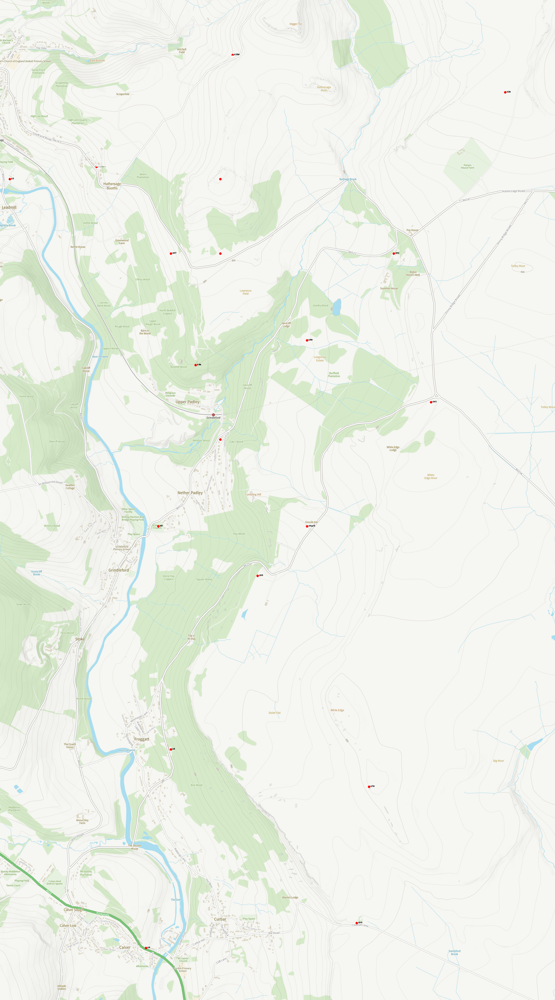

In [0]:
# Font settings (adjust as needed)
try:
    font = ImageFont.truetype("arial.ttf", 14)  # Try loading Arial
except IOError:
    font = ImageFont.load_default()  # Fallback if Arial is not available

# Marker settings
marker_radius = 5  # Radius of the checkpoint circle
marker_color = (255, 0, 0)  # Red color for marker
text_color = (0, 0, 0)  # Black text for labels

# Initialize the canvas
canvas_width = (x_max - x_min + 1) * TILE_SIZE
canvas_height = (y_max - y_min + 1) * TILE_SIZE
canvas = PILImage.new('RGB', (canvas_width, canvas_height), (255, 255, 255))

# Store processed tiles before stitching
tile_images = {}

# Loop through all tiles and download them
for zoom, x, y in tiles:
    tile_url = f"https://api.os.uk/maps/raster/v1/zxy/{MapStyle}/{zoom}/{x}/{y}.png?key={OrdnanceSurveyMapsAPIKey}"
    response = requests.get(tile_url)

    if response.status_code == 200:
        tile_img = PILImage.open(BytesIO(response.content))
        draw = ImageDraw.Draw(tile_img)

        # Find checkpoints that belong to this tile
        checkpoints_in_tile = openings_df.filter(
            (openings_df["tilename"] == f"{zoom}/{x}/{y}")
        ).collect()

        for checkpoint in checkpoints_in_tile:
            pixel_x, pixel_y = map(float, checkpoint["pixel_coords"].split(", "))
            name = checkpoint["CP"]  # Assuming column exists

            # Draw marker
            draw.ellipse(
                (pixel_x - marker_radius, pixel_y - marker_radius,
                 pixel_x + marker_radius, pixel_y + marker_radius),
                fill=marker_color
            )

            # Add text label
            draw.text((pixel_x + 8, pixel_y - 8), name, fill=text_color, font=font)

        # Store the modified tile
        tile_images[(x, y)] = tile_img

        print(f"Downloaded and processed tile: {tile_url}")
    else:
        print(f"Failed to download tile: {tile_url} - Status Code {response.status_code}")

# Stitch tiles onto the canvas
for (x, y), tile_img in tile_images.items():
    tile_x = (x - x_min) * TILE_SIZE
    tile_y = (y - y_min) * TILE_SIZE
    canvas.paste(tile_img, (tile_x, tile_y))

# Display the final image with checkpoints
display(canvas)


In [0]:
output_path = "/dbfs/tmp/stitched_map.png"  # Save to Databricks FileStore (DBFS)
canvas.save(output_path, format="PNG")
print(f"Stitched image saved at {output_path}")
stitched_image = PILImage.open("/dbfs/tmp/stitched_map.png")

dbutils.fs.cp("dbfs:/tmp/stitched_map.png", Folder+"/Dovetrek/stitched_map.png")

Stitched image saved at /dbfs/tmp/stitched_map.png


True